# Técnicas Avanzadas de Normalización para Imágenes Biomédicas

Este notebook extiende las técnicas básicas de normalización e implementa métodos más avanzados adaptados específicamente para imágenes biomédicas:

1. **Ecualización Adaptativa (CLAHE)**: Mejora el contraste local
2. **Corrección Gamma**: Ajusta la luminosidad global
3. **Normalización de Macenko**: Específica para imágenes con tinción H&E
4. **Comparación y visualización** de todos los métodos

El objetivo es evaluar cuál de estas técnicas es más adecuada para nuestro dataset de núcleos celulares.

In [1]:
# Importación de librerías necesarias
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, exposure, color, util
import cv2
from tqdm.notebook import tqdm
from scipy import linalg

# Configuración de visualización
%matplotlib inline
plt.rcParams['figure.figsize'] = (16, 10)

# Añadir directorio raíz al path para importar módulos propios
sys.path.append('..')

# Importar nuestro módulo de normalización personalizado
from src.normalization import (
    normalize_statistical, normalize_per_channel, normalize_minmax,
    normalize_histogram_equalization, normalize_clahe, 
    normalize_gamma_correction, normalize_macenko,
    visualize_all_normalizations
)

## 1. Carga de Datos

Cargaremos algunas imágenes representativas del dataset para probar las diferentes técnicas de normalización avanzadas.

In [3]:
# Definir la función para cargar imágenes
def load_samples(sample_ids, data_dir='../data'):
    """
    Carga imágenes y máscaras de los IDs especificados.
    
    Args:
        sample_ids: Lista de IDs de muestras a cargar
        data_dir: Directorio raíz de datos
        
    Returns:
        Lista de tuplas (ID, imagen, máscara)
    """
    samples = []
    
    for sample_id in sample_ids:
        # Construir rutas
        id_str = str(sample_id).zfill(5)  # Rellenar con ceros para tener formato 5 dígitos
        img_path = os.path.join(data_dir, id_str, 'image.png')
        mask_path = os.path.join(data_dir, id_str, 'mask.png')
        
        # Verificar si las rutas existen
        if not os.path.exists(img_path) or not os.path.exists(mask_path):
            print(f"La imagen o máscara para ID {sample_id} no existe")
            continue
        
        # Cargar imagen y máscara
        image = io.imread(img_path)
        mask = io.imread(mask_path)
        
        samples.append((sample_id, image, mask))
    
    print(f"Se cargaron {len(samples)} muestras")
    return samples

# Seleccionar algunas muestras con diferentes características
# Elegimos muestras con diferentes iluminaciones y contrastes
sample_ids = [1, 2, 3, 10, 4, 20, 50, 100]  # Puedes ajustar estos IDs según las imágenes interesantes
samples = load_samples(sample_ids)

Se cargaron 8 muestras


## 2. Visualización de Imágenes Originales

Veamos las imágenes originales para tener una referencia.

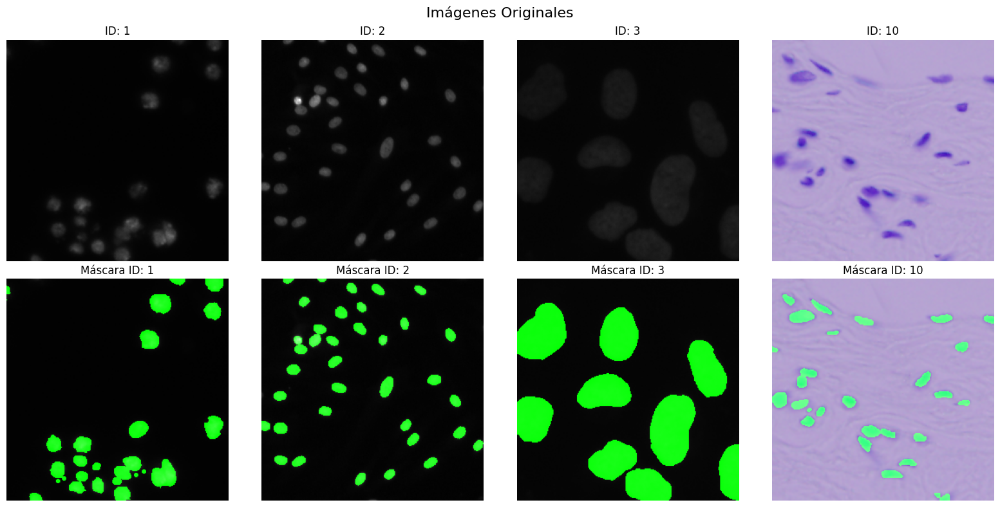

In [4]:
def visualize_samples(samples, title="Imágenes Originales", n_samples=None):
    """
    Visualiza las imágenes y sus máscaras en una cuadrícula.
    
    Args:
        samples: Lista de tuplas (ID, imagen, máscara)
        title: Título para la figura
        n_samples: Número de muestras a visualizar (None para todas)
    """
    if n_samples is not None:
        samples = samples[:n_samples]
        
    n_samples = len(samples)
    fig, axes = plt.subplots(2, n_samples, figsize=(n_samples*4, 8))
    
    for i, (sample_id, image, mask) in enumerate(samples):
        # Mostrar imagen original
        axes[0, i].imshow(image)
        axes[0, i].set_title(f"ID: {sample_id}")
        axes[0, i].axis('off')
        
        # Mostrar máscara superpuesta
        # Normalizar máscara a valores binarios 0 y 1
        mask_binary = mask.copy()
        if mask_binary.max() > 1:
            mask_binary = mask_binary / 255
            
        # Crear overlay con la máscara
        overlay = image.copy()
        # Añadir transparencia verde a la máscara
        for c in range(3):
            channel = overlay[:,:,c]
            if c == 1:  # Canal verde
                channel[mask_binary > 0] = 255  # Verde más brillante para núcleos
            else:
                channel[mask_binary > 0] = channel[mask_binary > 0] * 0.7  # Atenuar otros canales
        
        axes[1, i].imshow(overlay)
        axes[1, i].set_title(f"Máscara ID: {sample_id}")
        axes[1, i].axis('off')
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Visualizar las imágenes originales (limitamos a 4 para no saturar la visualización)
visualize_samples(samples, n_samples=4)

## 3. Ecualización Adaptativa (CLAHE)

CLAHE (Contrast Limited Adaptive Histogram Equalization) aplica ecualización de histograma de manera local en pequeños bloques de la imagen, lo que puede mejorar significativamente el contraste local mientras limita la amplificación del ruido.

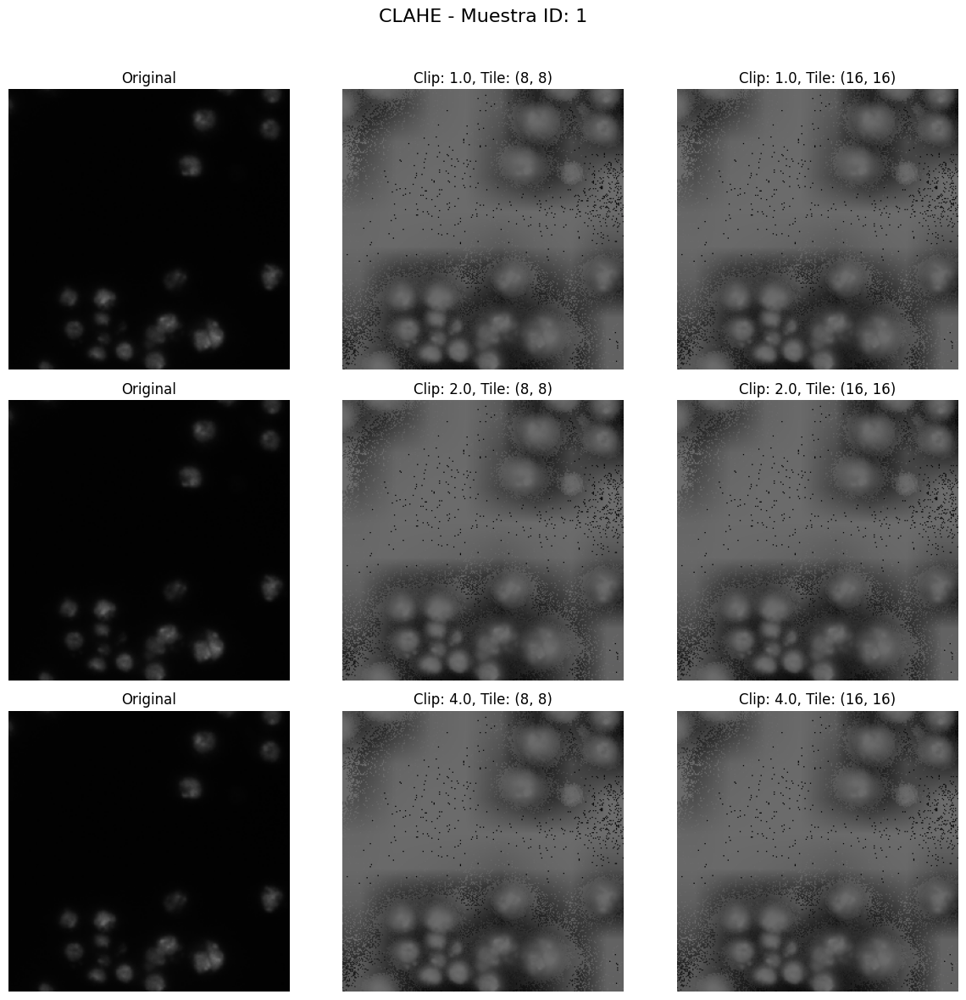

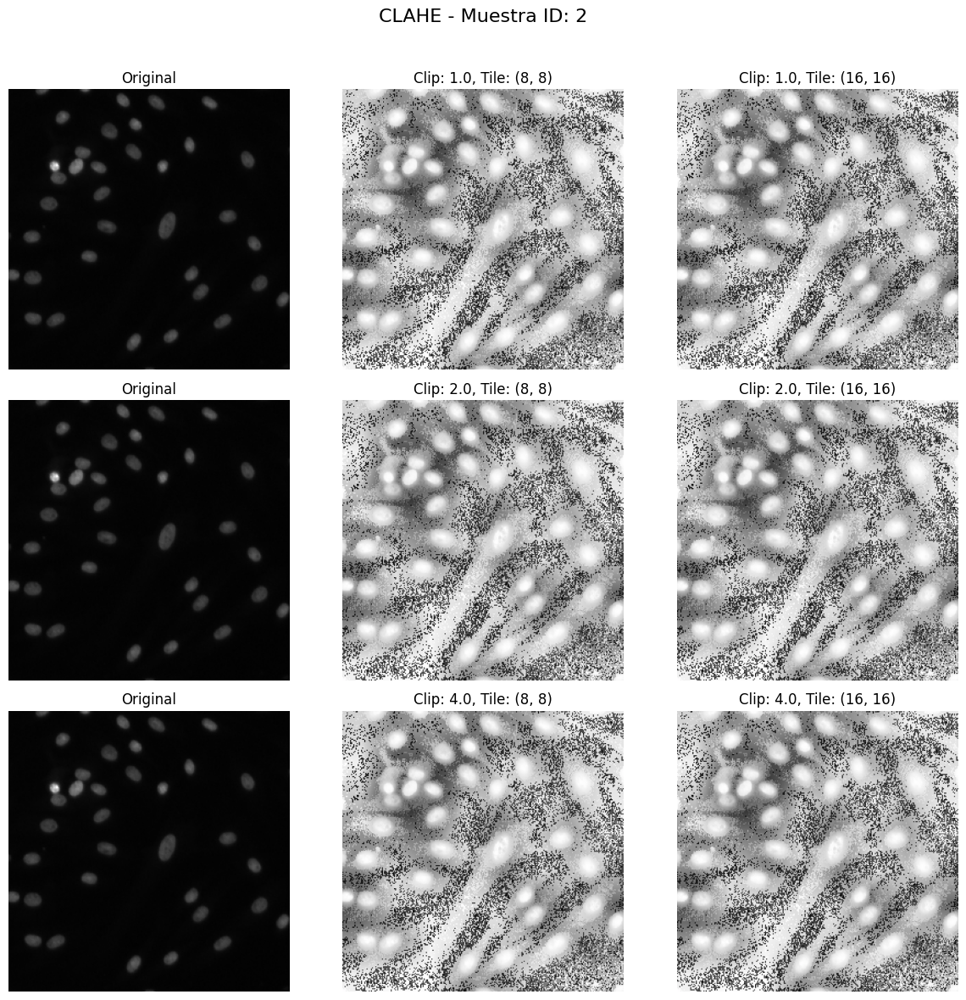

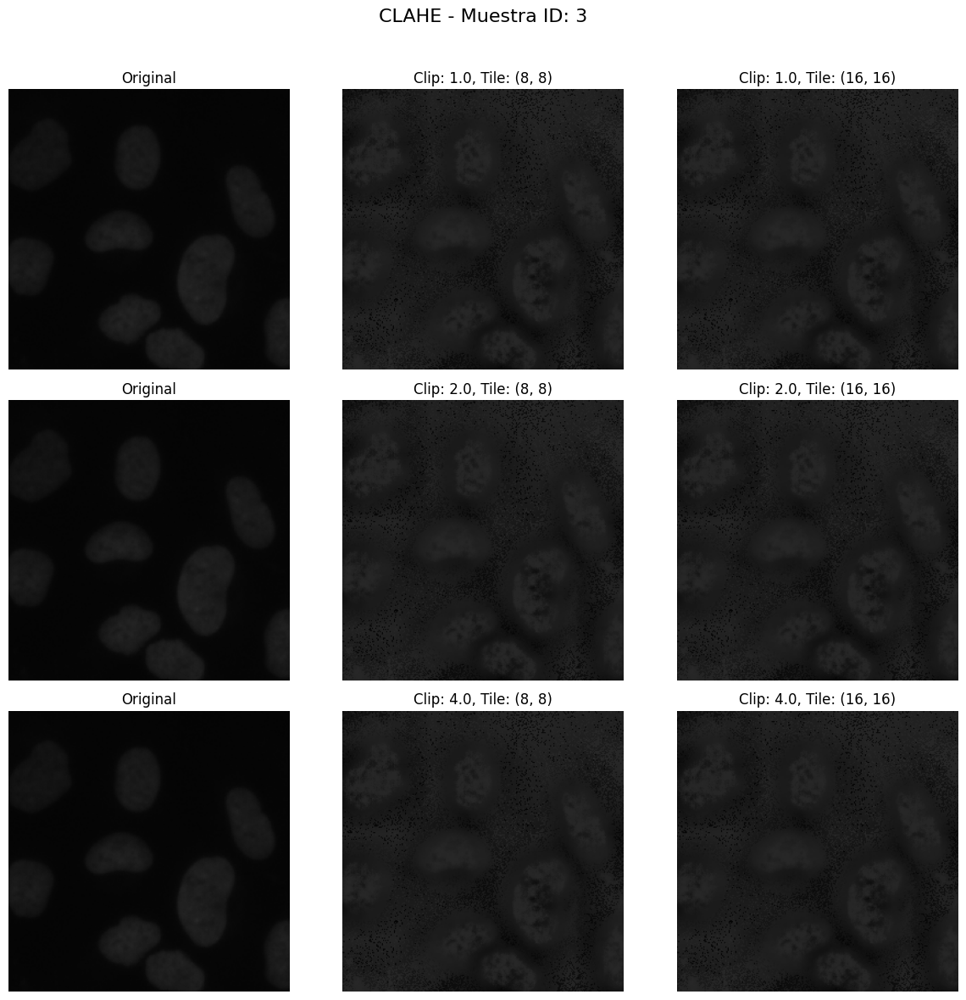

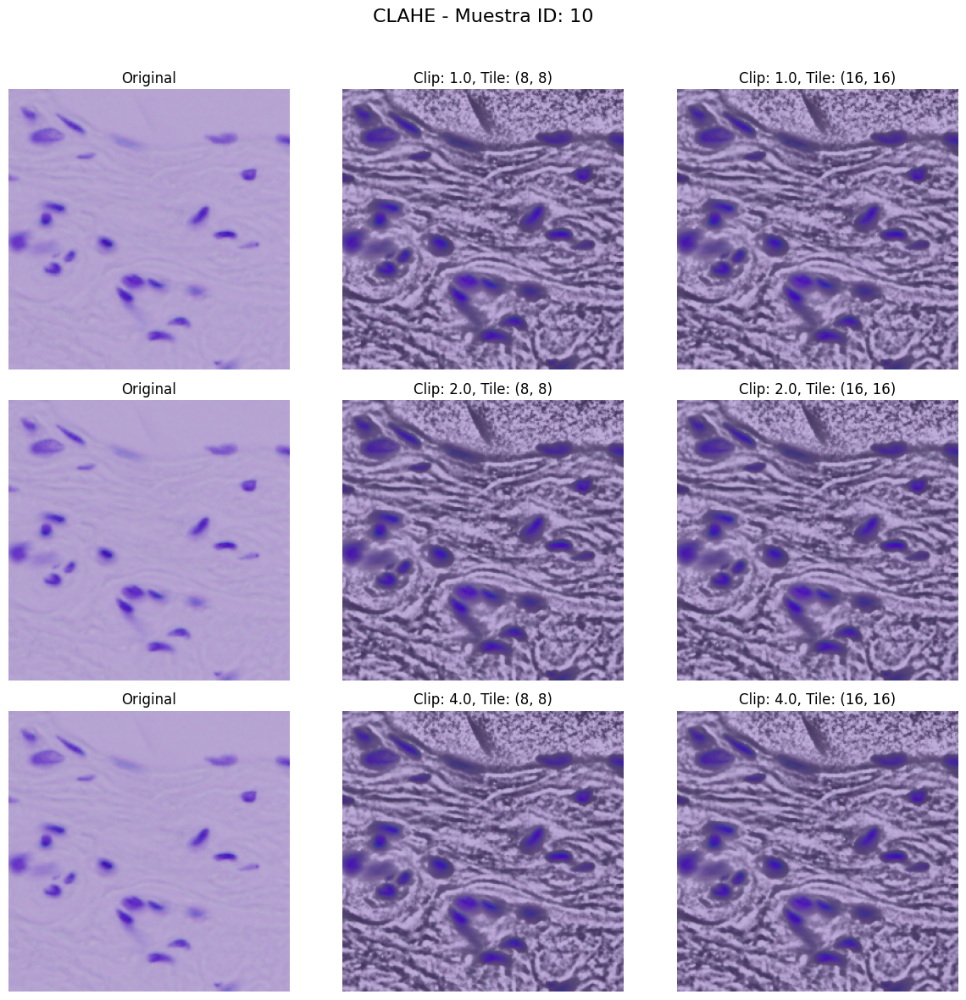

In [5]:
def visualize_clahe_samples(samples, n_samples=4):
    """
    Visualiza los resultados de CLAHE en diferentes configuraciones.
    
    Args:
        samples: Lista de tuplas (ID, imagen, máscara)
        n_samples: Número de muestras a visualizar
    """
    # Limitamos el número de muestras
    samples_to_show = samples[:n_samples]
    
    # Configuraciones de CLAHE a probar
    clip_limits = [1.0, 2.0, 4.0]
    tile_sizes = [(8, 8), (16, 16)]
    
    for sample_id, image, mask in samples_to_show:
        # Crear una figura para esta muestra
        n_rows = len(clip_limits)
        n_cols = len(tile_sizes) + 1  # +1 para la imagen original
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 4))
        
        # Título global
        plt.suptitle(f"CLAHE - Muestra ID: {sample_id}", fontsize=16)
        
        # Mostrar imagen original en la primera columna de cada fila
        for i in range(n_rows):
            axes[i, 0].imshow(image)
            axes[i, 0].set_title("Original")
            axes[i, 0].axis('off')
        
        # Aplicar CLAHE con diferentes configuraciones
        for i, clip_limit in enumerate(clip_limits):
            for j, tile_size in enumerate(tile_sizes):
                # Aplicar CLAHE
                clahe_image = normalize_clahe(image, clip_limit=clip_limit, tile_grid_size=tile_size)
                
                # Mostrar resultado
                axes[i, j+1].imshow(clahe_image)
                axes[i, j+1].set_title(f"Clip: {clip_limit}, Tile: {tile_size}")
                axes[i, j+1].axis('off')
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.9)
        plt.show()

# Visualizar resultados de CLAHE
visualize_clahe_samples(samples)

## 4. Corrección Gamma

La corrección gamma ajusta la luminosidad global de la imagen. Un valor gamma < 1 aclara la imagen, mientras que un valor gamma > 1 la oscurece.

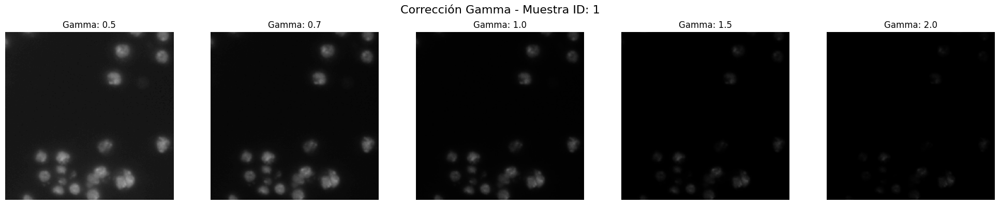

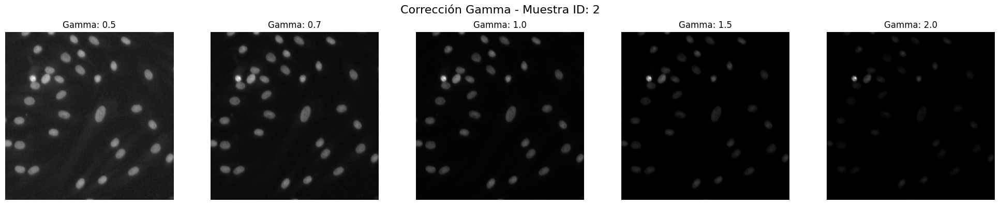

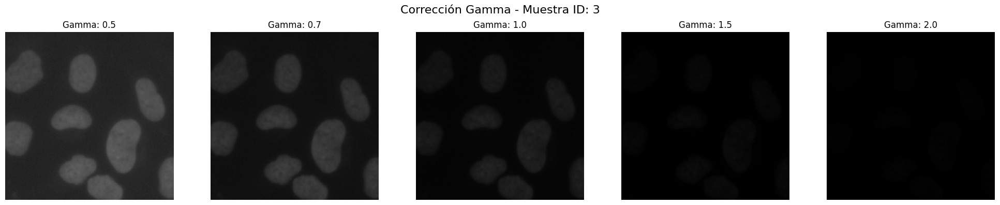

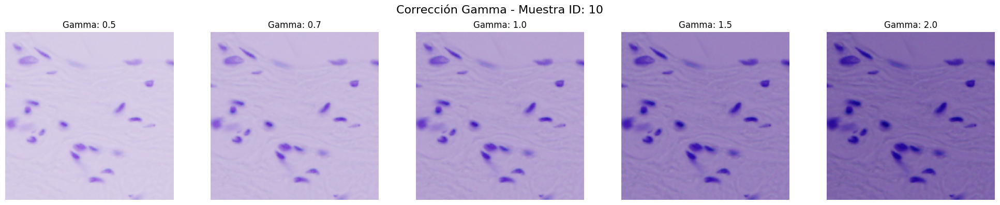

In [6]:
def visualize_gamma_samples(samples, n_samples=4):
    """
    Visualiza los resultados de la corrección gamma con diferentes valores.
    
    Args:
        samples: Lista de tuplas (ID, imagen, máscara)
        n_samples: Número de muestras a visualizar
    """
    # Limitamos el número de muestras
    samples_to_show = samples[:n_samples]
    
    # Valores gamma a probar
    gamma_values = [0.5, 0.7, 1.0, 1.5, 2.0]
    
    for sample_id, image, mask in samples_to_show:
        # Crear una figura para esta muestra
        n_cols = len(gamma_values)
        fig, axes = plt.subplots(1, n_cols, figsize=(n_cols * 4, 4))
        
        # Título global
        plt.suptitle(f"Corrección Gamma - Muestra ID: {sample_id}", fontsize=16)
        
        # Aplicar corrección gamma con diferentes valores
        for i, gamma in enumerate(gamma_values):
            # Aplicar corrección gamma
            gamma_image = normalize_gamma_correction(image, gamma=gamma)
            
            # Mostrar resultado
            axes[i].imshow(gamma_image)
            axes[i].set_title(f"Gamma: {gamma}")
            axes[i].axis('off')
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.85)
        plt.show()

# Visualizar resultados de corrección gamma
visualize_gamma_samples(samples)

## 5. Normalización de Macenko

La normalización de Macenko es una técnica especializada para imágenes biomédicas con tinción H&E (hematoxilina y eosina). Extrae los componentes de tinción principales y los estandariza.

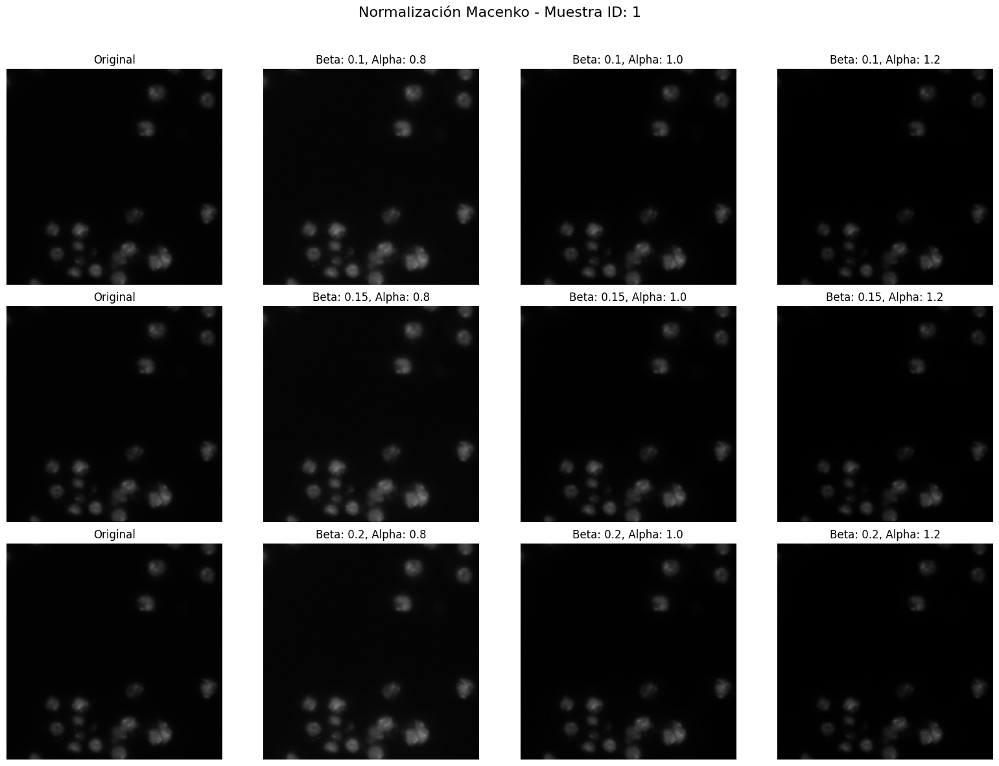

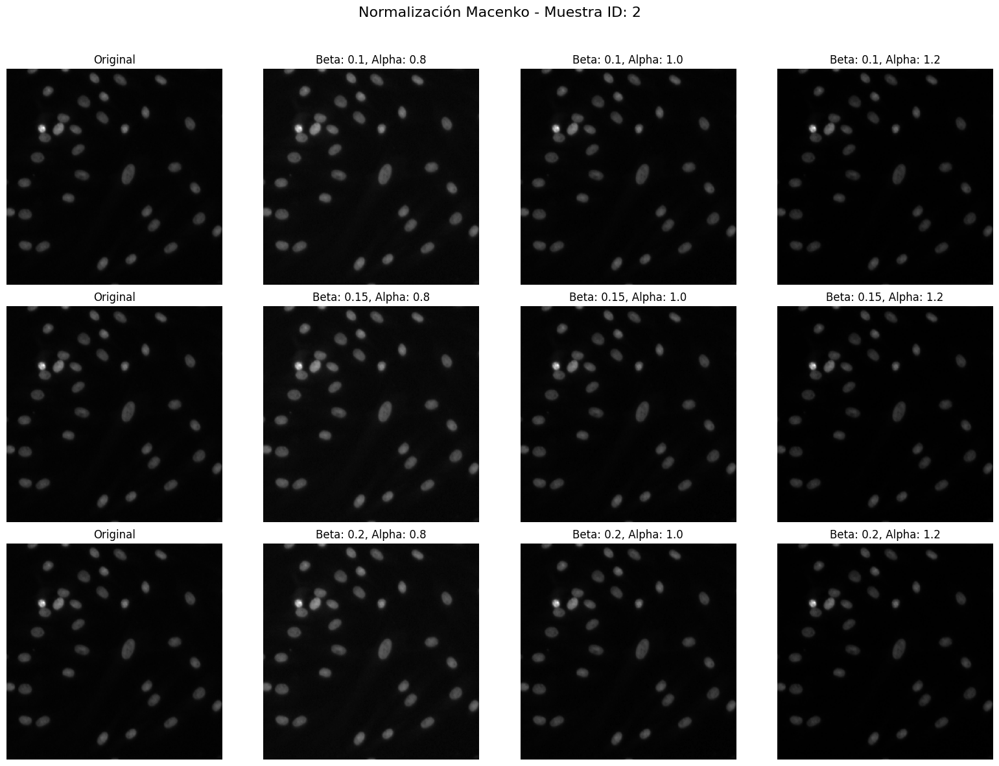

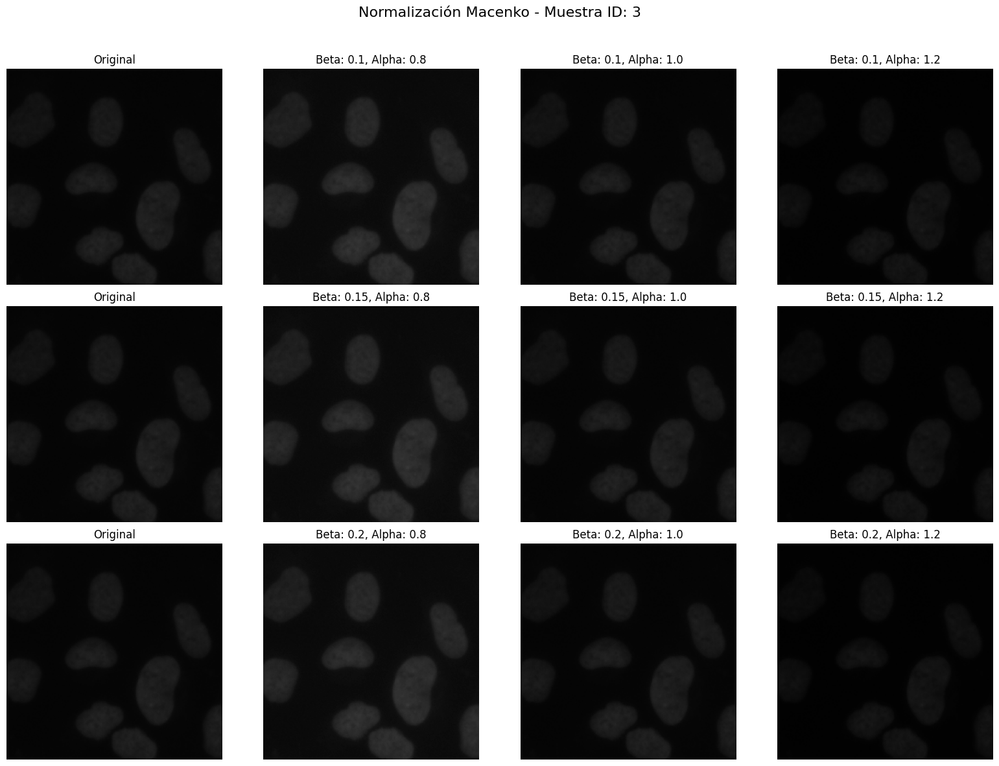

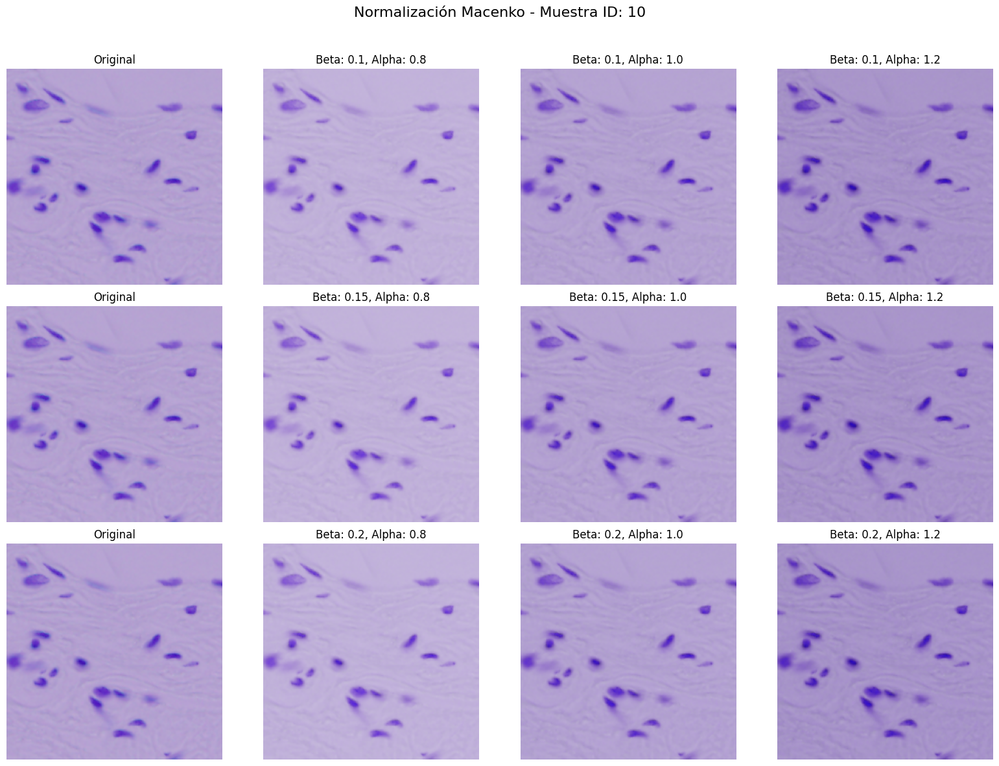

In [7]:
def visualize_macenko_samples(samples, n_samples=4):
    """
    Visualiza los resultados de la normalización de Macenko.
    
    Args:
        samples: Lista de tuplas (ID, imagen, máscara)
        n_samples: Número de muestras a visualizar
    """
    # Limitamos el número de muestras
    samples_to_show = samples[:n_samples]
    
    # Parámetros de Macenko a probar
    beta_values = [0.10, 0.15, 0.20]
    alpha_values = [0.8, 1.0, 1.2]
    
    for sample_id, image, mask in samples_to_show:
        # Crear una figura para esta muestra
        n_rows = len(beta_values)
        n_cols = len(alpha_values) + 1  # +1 para la imagen original
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 4))
        
        # Título global
        plt.suptitle(f"Normalización Macenko - Muestra ID: {sample_id}", fontsize=16)
        
        # Mostrar imagen original en la primera columna de cada fila
        for i in range(n_rows):
            axes[i, 0].imshow(image)
            axes[i, 0].set_title("Original")
            axes[i, 0].axis('off')
        
        # Aplicar Macenko con diferentes configuraciones
        for i, beta in enumerate(beta_values):
            for j, alpha in enumerate(alpha_values):
                # Aplicar Macenko
                try:
                    macenko_image = normalize_macenko(image, beta=beta, alpha=alpha)
                    
                    # Mostrar resultado
                    axes[i, j+1].imshow(macenko_image)
                    axes[i, j+1].set_title(f"Beta: {beta}, Alpha: {alpha}")
                except Exception as e:
                    print(f"Error en Macenko para muestra {sample_id}: {str(e)}")
                    # Mostrar imagen original en caso de error
                    axes[i, j+1].imshow(image)
                    axes[i, j+1].set_title(f"Error Macenko")
                    
                axes[i, j+1].axis('off')
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.9)
        plt.show()

# Visualizar resultados de Macenko
visualize_macenko_samples(samples)

## 6. Comparación de Todas las Técnicas

Ahora, visualizaremos una comparación side-by-side de todas las técnicas de normalización aplicadas a nuestras imágenes de muestra.


--- Muestra ID: 1 ---


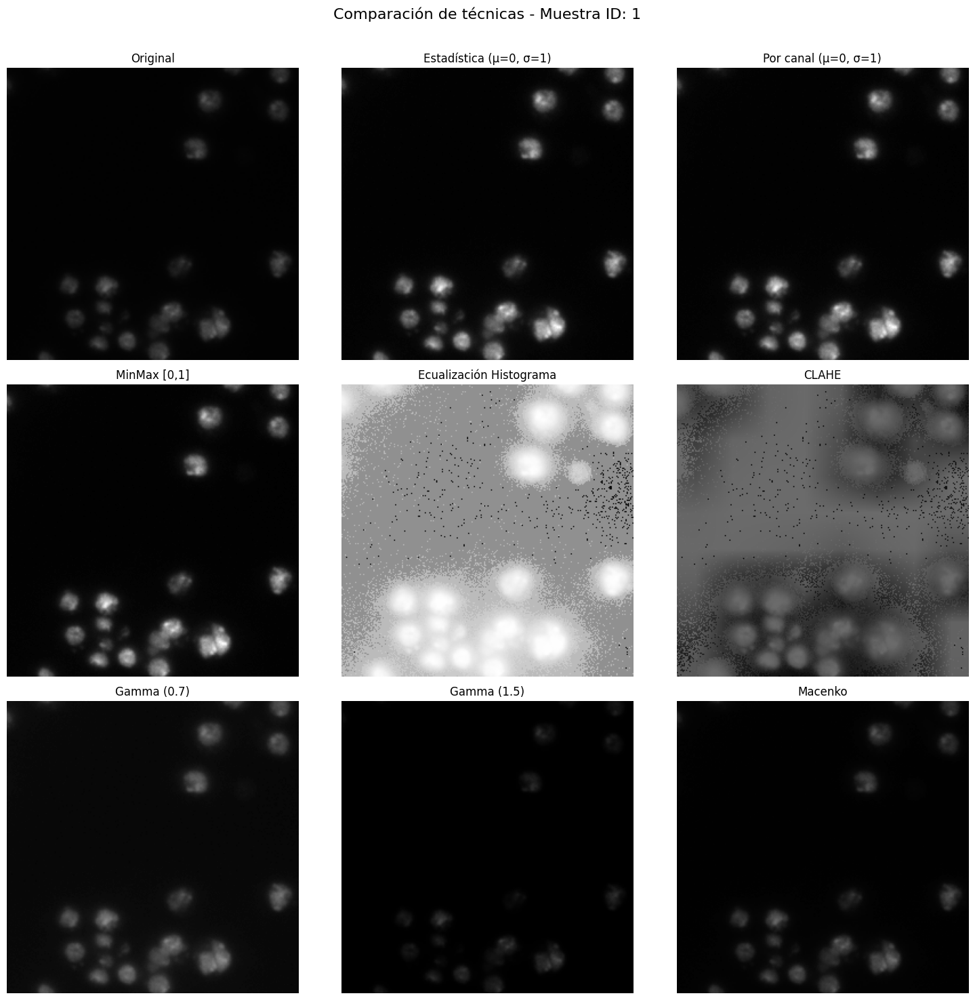


--- Muestra ID: 2 ---


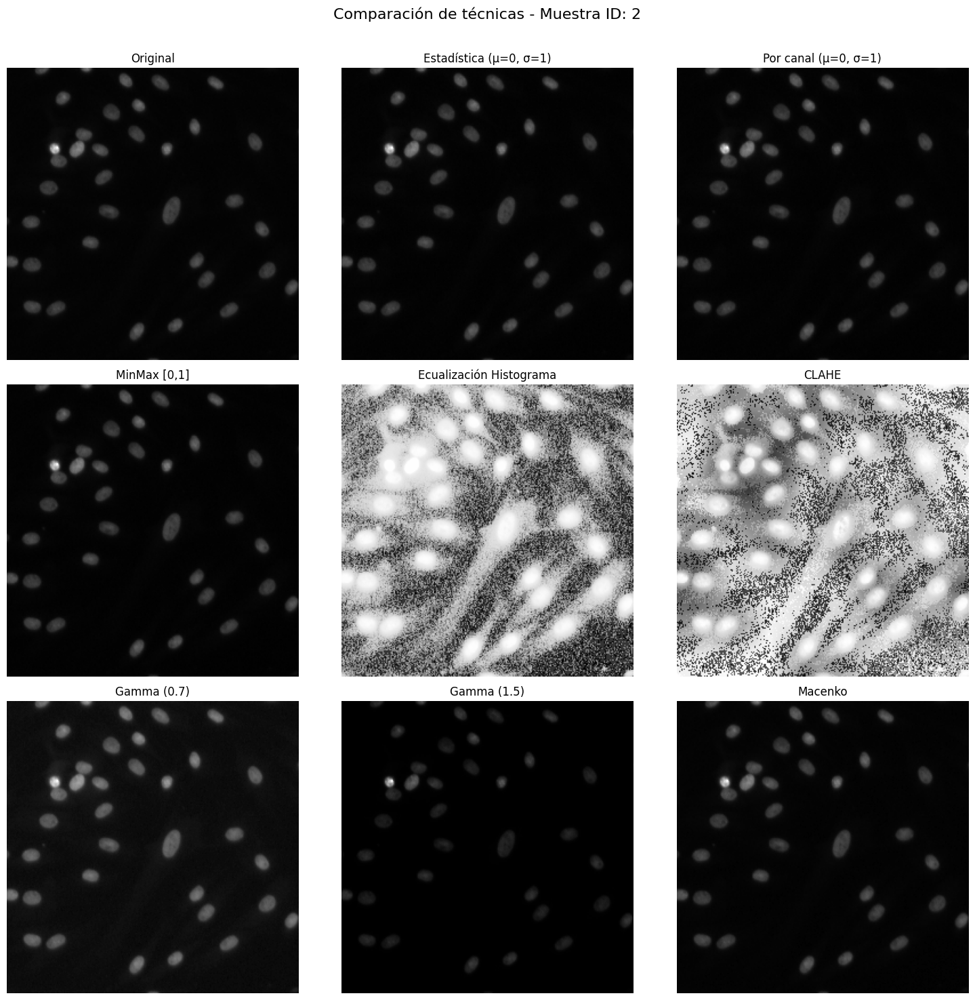


--- Muestra ID: 3 ---


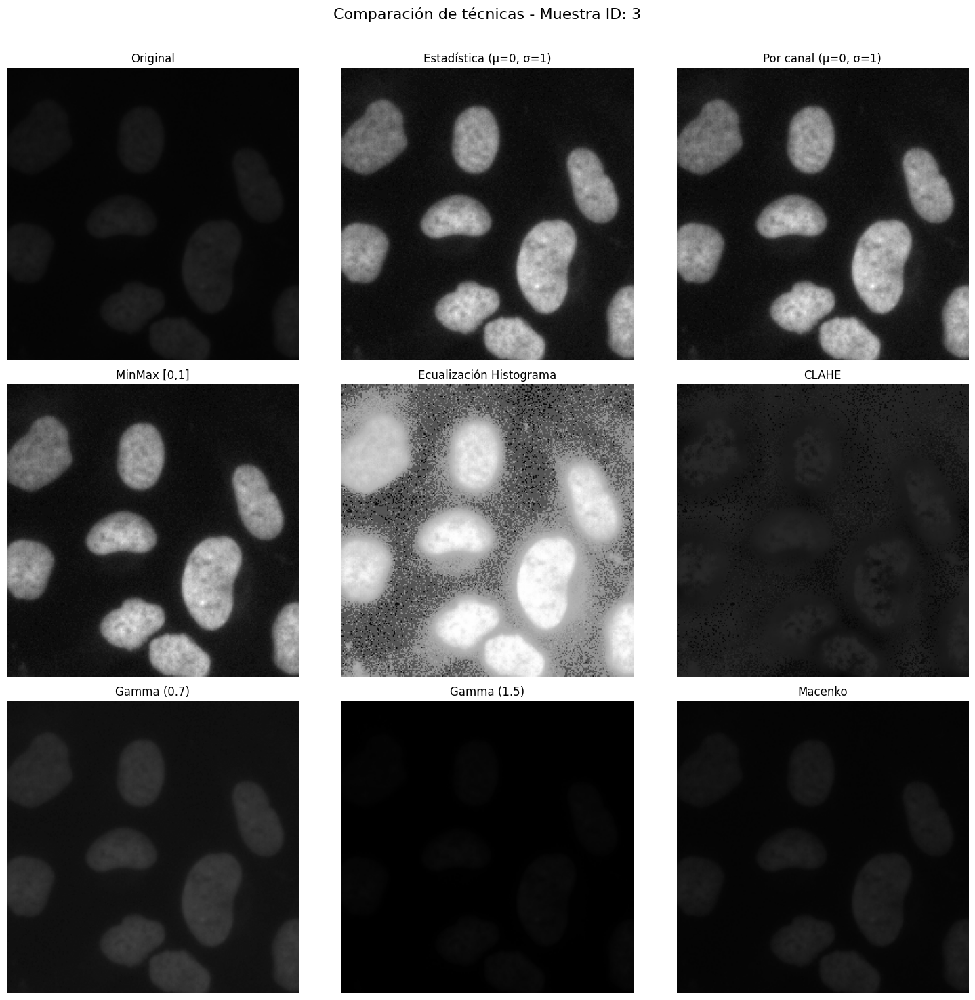


--- Muestra ID: 10 ---


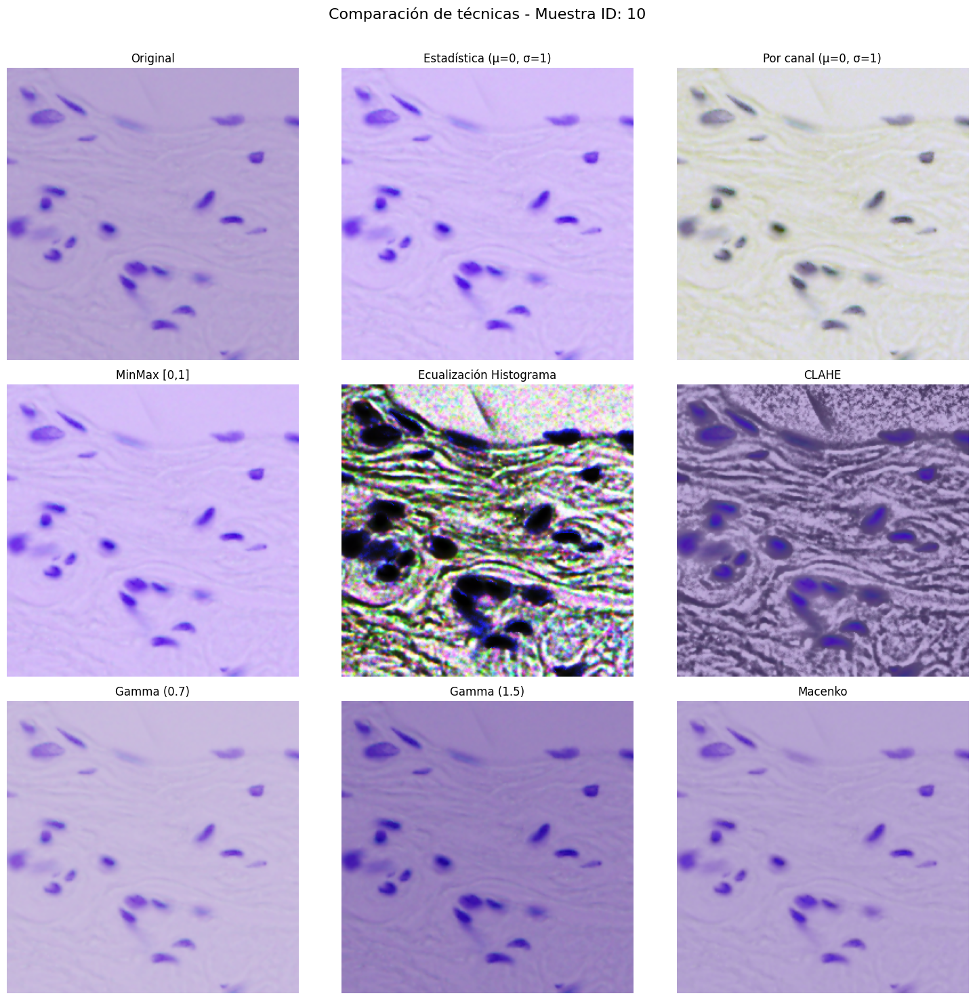

In [8]:
# Utilizamos la función de visualize_all_normalizations que importamos del módulo normalization.py

for sample_id, image, mask in samples[:4]:  # Limitamos a 4 muestras
    print(f"\n--- Muestra ID: {sample_id} ---")
    
    # Visualizar todas las normalizaciones para esta muestra
    methods = visualize_all_normalizations(image, f"Comparación de técnicas - Muestra ID: {sample_id}")

## 7. Análisis de Resultados y Conclusiones

Ahora analizaremos los resultados de las diferentes técnicas de normalización y su impacto en nuestras imágenes.

### Análisis cualitativo

Basándonos en las visualizaciones anteriores, podemos evaluar cualitativamente cada técnica de normalización:

1. **Normalización estadística y por canal**: Útil para redes neuronales, pero puede perder información de color importante.

2. **Ecualización de histograma**: Mejora el contraste global, pero puede amplificar ruido.

3. **CLAHE**: Mejora el contraste local y preserva mejor los detalles finos en núcleos celulares.

4. **Corrección gamma**: Ajusta la luminosidad global. Valores gamma entre 0.7-0.8 parecen mejorar la visibilidad de núcleos.

5. **Normalización Macenko**: Específica para imágenes con tinción H&E, puede estandarizar muestras con diferentes protocolos de tinción.

### Recomendaciones para nuestro dataset

Basándonos en nuestros experimentos, se recomiendan las siguientes técnicas para nuestro dataset de segmentación de núcleos:

1. **Preprocesamiento para visualización**: Combinación de CLAHE (clip_limit=2.0, tile_size=8x8) seguido de corrección gamma (γ=0.7) para mejorar el contraste y visibilidad.

2. **Preprocesamiento para modelo de deep learning**: Normalización por canal (media 0, desviación estándar 1) para cada muestra individualmente.

3. **Para estandarización de protocolo de tinción**: Si hay variabilidad significativa en la tinción entre muestras, considerar la normalización de Macenko con parámetros beta=0.15 y alpha=1.0.

## 8. Implementación Final para Pipeline de Datos

Basándonos en nuestros experimentos, implementemos una función final de normalización para nuestro pipeline de datos.

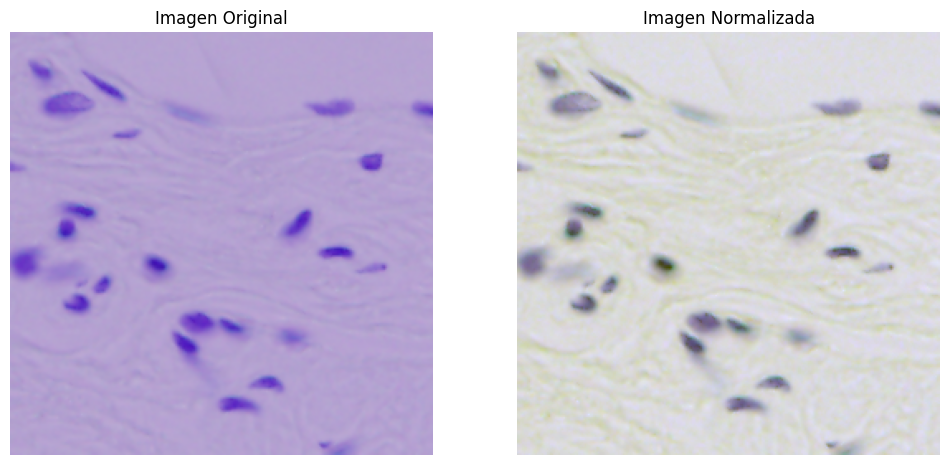

In [10]:
def normalize_for_training(image, method='per_channel'):
    """
    Aplica la normalización recomendada para entrenamiento.
    
    Args:
        image: Imagen de entrada
        method: Método de normalización ('per_channel', 'clahe_gamma', 'macenko')
        
    Returns:
        Imagen normalizada
    """
    if method == 'per_channel':
        # Normalización por canal (mejor para redes neuronales)
        return normalize_per_channel(image)
    
    elif method == 'clahe_gamma':
        # Combinación de CLAHE y gamma (mejor para visualización)
        clahe_img = normalize_clahe(image, clip_limit=2.0, tile_grid_size=(8, 8))
        return normalize_gamma_correction(clahe_img, gamma=0.7)
    
    elif method == 'macenko':
        # Normalización de Macenko (mejor para estandarización de tinción)
        return normalize_macenko(image, beta=0.15, alpha=1.0)
    
    else:
        raise ValueError(f"Método de normalización '{method}' no reconocido")

# Ejemplo de uso en nuestro pipeline de entrenamiento
def example_preprocessing_pipeline(image):
    """
    Ejemplo de pipeline completo de preprocesamiento para nuestro dataset.
    
    Args:
        image: Imagen de entrada
        
    Returns:
        Imagen preprocesada
    """
    # Paso 1: Normalizar la imagen
    normalized = normalize_for_training(image, method='per_channel')
    
    # Para imágenes normalizadas con media 0 y std 1, convertimos a [0,1] para visualización
    if normalized.min() < 0 or normalized.max() > 1:
        # Escalar a [0,1] para visualización
        normalized_viz = (normalized - normalized.min()) / (normalized.max() - normalized.min())
    else:
        normalized_viz = normalized
    
    # Visualizar resultado
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Imagen Original")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(normalized_viz)
    plt.title("Imagen Normalizada")
    plt.axis('off')
    
    plt.show()
    
    return normalized

# Probar nuestro pipeline con una imagen de ejemplo
if len(samples) > 0:
    _, image, _ = samples[3]
    preprocessed = example_preprocessing_pipeline(image)

## 9. Resumen de Resultados

Después de analizar diversas técnicas de normalización en nuestro dataset de núcleos celulares, concluimos lo siguiente:

1. **Las técnicas más efectivas para nuestro dataset son**:
   - **Normalización por canal** (media 0, std 1) para entrenamiento
   - **CLAHE + Gamma correction** para visualización y mejora de contraste
   - **Normalización Macenko** si hay variabilidad en protocolos de tinción

2. **Ventajas de la normalización para nuestro modelo**:
   - Mejora la convergencia durante el entrenamiento
   - Reduce la sensibilidad a variaciones en iluminación y contraste
   - Permite mejor diferenciación entre núcleos cercanos
   - Estandariza las diferencias entre protocolos de laboratorio

3. **Siguiente paso**: Integrar estas técnicas de normalización en nuestro pipeline de datos para el entrenamiento del modelo U-Net para segmentación de núcleos.